# Lakes

Multiple ERA5 static climate fields, for example lake cover or vegetation, were recently updated from V15 to V20. For a full comparison of how these fields have changed see `A1.V20_vs_V15.ipynb`.

Moreover, there is also additional information such as how lake cover varies month-to-month and the salinity of lakes.

Given this updated information, it is of interest to establish whether a model trained using this new information can make more accurate predictions than a model without. If so, this indicates that the updated fields are an improvement, i.e. they more closely approximate the real world.

We consider the following predictive models:

* V15: Time varying ERA5 fields + the following static V15 climate fields: `lsm,cl,dl,cvh,cvl,si10`
* V20: Time varying ERA5 fields, the static V15 climate fields listed above + V20 corrections to each of those fields



2016 2017, predict on 2019


---


## 0. Global variables

First we will declare some variables, functions and useful calculations that will be shared among the sections below. If you just want to see the analysis, skip to `1.V15 vs V20`.

In [1]:
#VARIABLES

V15_model =  '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/processed_data/trained_models/V20_2016/'
V20_model =  '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/processed_data/trained_models/V20_salt_lakes_and_monthly_lakes_2016/'



tolerance = 0.1 #If the change in a variable is greater than tolerance, the change is marked as significant. This is important for defining the grouping bitstring categories.


In [8]:
# FUNCTIONS
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import cartopy.crs as ccrs
import matplotlib.colors as mc
import matplotlib.colorbar as cb 
from scipy.stats import ttest_ind
import numpy as np
import seaborn as sns

def calculate_delta_field(filename,parameter):
    
    
    """
    Function to determine the change in a parameter when going from V15 to V20
    """
    
    root = '/network/group/aopp/predict/TIP016_PAXTON_RPSPEEDY/ML4L/ECMWF_files/raw/'
    version = ['v015', 'v020']
    
    ds = [] #Array to hold results
    for v in version:
        path = root+f'climate.{v}/climate.{v}/639l_2/{filename}'
        ds_i= xr.open_dataset(path,engine='cfgrib',backend_kwargs={'indexpath': ''},filter_by_keys={'shortName':parameter}) #only want this one parameter
        
        ds.append(ds_i)
        
    #Take the difference, and make it a nice pandas df    
    delta_field = ds[1] - ds[0] #V20 - V15
    delta_field =  delta_field.assign_coords({"longitude": (((delta_field.longitude + 180) % 360) - 180)}) #long3 ---> long1
    delta_field = delta_field.to_dataframe().reset_index()
    
    V20_df = ds[1].to_dataframe().reset_index()
    V15_df = ds[0].to_dataframe().reset_index()

    if parameter == '10si': #seaice shortname is inverse to variable name
        parameter='si10'
    
    delta_field[f'V15_{parameter}'] = V15_df[parameter]
    delta_field[f'V20_{parameter}'] = V20_df[parameter]
    delta_field = delta_field.rename(columns={f'{parameter}': f'change_in_{parameter}'})
    delta_field[f'percentage_change_in_{parameter}'] = (delta_field[f'V20_{parameter}'] - delta_field[f'V15_{parameter}']) / delta_field[f'V15_{parameter}']

    return delta_field


def plot_map(ds,z,vmin,vmax,cmap,logscale,title,limits,markersize):
    
    """Hacky function plotting the value of `z` at latitude/longitude points
       as a scatter map"""

    try:
        x = ds.longitude
        y = ds.latitude
    except: # different sources call lat/lon different things
        x = ds.longitude_ERA
        y = ds.latitude_ERA
    
    z1 = ds[z]
    

    
    #Setup figure and axes
    fig = plt.figure(figsize=[30,20])
    gs = GridSpec(1, 2, figure=fig, width_ratios=[50,1])
    ax = fig.add_subplot(gs[0], projection=ccrs.PlateCarree(central_longitude=0))
    cax = fig.add_subplot(gs[1])
    
    #Cmaps, normalisations
    if logscale:
        norm = mc.LogNorm(vmin=vmin, vmax=vmax)
        z1 = abs(z1)
    else:
        norm = mc.Normalize(vmin=vmin, vmax=vmax)

    
    cb1 = cb.ColorbarBase(cax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')
    
    
    
    #Plot it
    sc=ax.scatter(x,y,s=markersize,c=cmap(norm(z1)),
                linewidths=1, alpha=.7)

    
    #Tidy up
    ax.axhline(70, c='0.5', linestyle='--')
    ax.axhline(-70, c='0.5', linestyle='--') #latitude cutoffs

    ax.set_title(title,fontsize=30)    
    ax.coastlines()

    
    ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
    ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=ccrs.PlateCarree())
    ax.set_aspect('auto') #Force projection aspect ratio
    
    if limits is not None:
        ax.set_xlim(limits['xlow'],limits['xhigh'])
        ax.set_ylim(limits['ylow'],limits['yhigh'])
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()
    
    
    
    
    
def load_predictions(model):

    """For this model, load the predictions and determine the prediction error"""
    
    df = pd.read_parquet(model+'predictions.parquet')
    
    #Calculate some extra columns
    df['predicion_bias'] = df.MODIS_LST - df.predictions
    df['predicion_error'] = abs(df.MODIS_LST - df.predictions)


    print("Mean/Median/Std prediction bias:", df['predicion_bias'].mean(), df['predicion_bias'].median(),df['predicion_bias'].std())
    print("Mean/Median/Std prediction error:", df['predicion_error'].mean(), df['predicion_error'].median(),df['predicion_error'].std())

    #Average predictions and errors over the year
    df_grouped = df.groupby(['latitude_ERA', 'longitude_ERA'],as_index=False).mean() 


    return df,df_grouped



def plot_distribution(df,x,xlabel):
    

    """Plot the distribution of the quantity `x` in df """

    #Setup plot env
    h,w = 20,20
    sns.set_theme(context='talk', 
                  style='ticks', 
                  palette='deep',
                  rc={'figure.figsize':(h,w)}
                  )
    #Figure
    fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize=(h,w))
    sns.histplot(df[x], bins='auto', ax=ax1,stat='probability',kde=False,alpha=0.7,color='C0')

    # Config
    ax1.set_xlabel(xlabel)

    ax1.axvline(0,c='0.5', linestyle='--')
    
    #Prints
    print ('Number of samples:', len(df))
    plt.show()
    
    
    
    
    
    
    
#-------------------------------------
    
def classify(x,tol):
    
    if abs(x) > tol:
        return True
    else:
        return False
    
    
        
def bit(x):
    
    if x:
        return 1
    else:
        return 0


def bitstring(list_of_columns):
    
    bitstring=''
    for i in list_of_columns:
        idx = bit(i)
        bitstring += str(idx)
        
    return bitstring
    
#-------------------------------------
    
def significance_test(v1,v2):
    try:
        return ttest_ind(v1, v2)
    except:
        return np.nan

def significance_boolean(x):
    
    try:
        pval = x[-1]
    except:
        #Nans are not subscriptable
        return 'Insignificant'
    
    if (pval > 0.01) or np.isnan(pval): 
        return 'Insignificant'
    else:
        return 'Significant'

    

In [3]:
#CALCULATIONS

#Calculate all the delta fields i.e. the change in parameter V15-->V20
clake_delta_field  = calculate_delta_field('clake','cl')        #How does cl change?
seaice_delta_field = calculate_delta_field('cicecap','10si')    #How does seaice change
cvh_delta_field    = calculate_delta_field('cvh','cvh')         #How does cvh change?
cvl_delta_field    = calculate_delta_field('cvl','cvl')         #How does cvl change
lsm_delta_field    = calculate_delta_field('lsmoro','lsm')      #How does lsm change?

#Bring all the delta fields together
change_in_fields = pd.concat([clake_delta_field,seaice_delta_field,cvh_delta_field,cvl_delta_field,lsm_delta_field],axis=1)
change_in_fields = change_in_fields.loc[:,~change_in_fields.columns.duplicated()] #remove duplicated column names that arise due to the concat


# Classify every grid point according to the delta fields
# First create 5 boolean columns for whether the change in the field is significant, where significane is determined by `tolerance`     
for parameter in ['cl','si10','cvh','cvl','lsm']:
    change_in_fields[f'{parameter}_change_is_significant'] = change_in_fields.apply(lambda x : classify(x[f'change_in_{parameter}'],tolerance), axis = 1)
    
# Then create a single group bitstring for all combinations of booleans
change_in_fields[f'bitstring'] = change_in_fields.apply(lambda x : bitstring( [x['cl_change_is_significant'],
                                                                               x['cvh_change_is_significant'],
                                                                               x['cvl_change_is_significant'],
                                                                               x['lsm_change_is_significant'],
                                                                               x['si10_change_is_significant']    # ALPHABETICAL
                                                                              ]
                                                                               ), axis = 1)

In [4]:
display_table = change_in_fields.groupby(['bitstring']).count()[['values']]
display_table = display_table.rename(columns={"values": "Number of Pixels"})
display(display_table.sort_values(by='Number of Pixels',ascending=False))

,Number of Pixels
bitstring,
00000,533509
00001,2762
10000,2728
10010,1834
00010,533
00011,381
10001,87
00100,75
10011,42


---


## 1. V15 vs V20 <a name="V15V20"></a>

In [9]:
V15_predictions,V15_predictions_averaged = load_predictions(V15_model)
V20_predictions,V20_predictions_averaged = load_predictions(V20_model)

Mean/Median/Std prediction bias: -0.00080437923 0.08718872 4.1788526
Mean/Median/Std prediction error: 3.1157644 2.375702 2.7847474
Mean/Median/Std prediction bias: 0.081678 0.19390869 4.157928
Mean/Median/Std prediction error: 3.0958135 2.3613586 2.776861


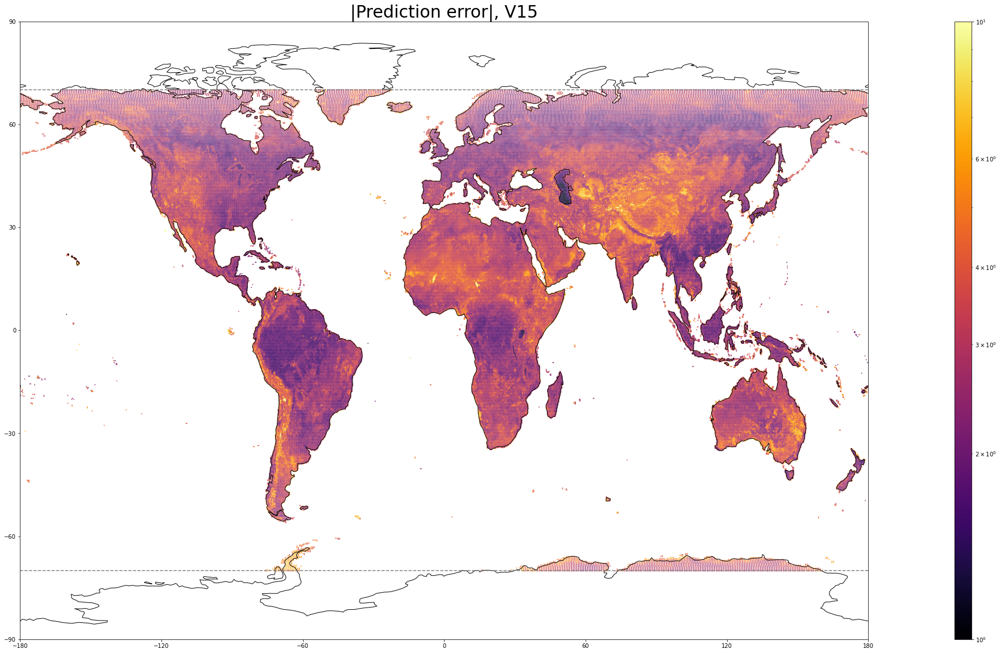

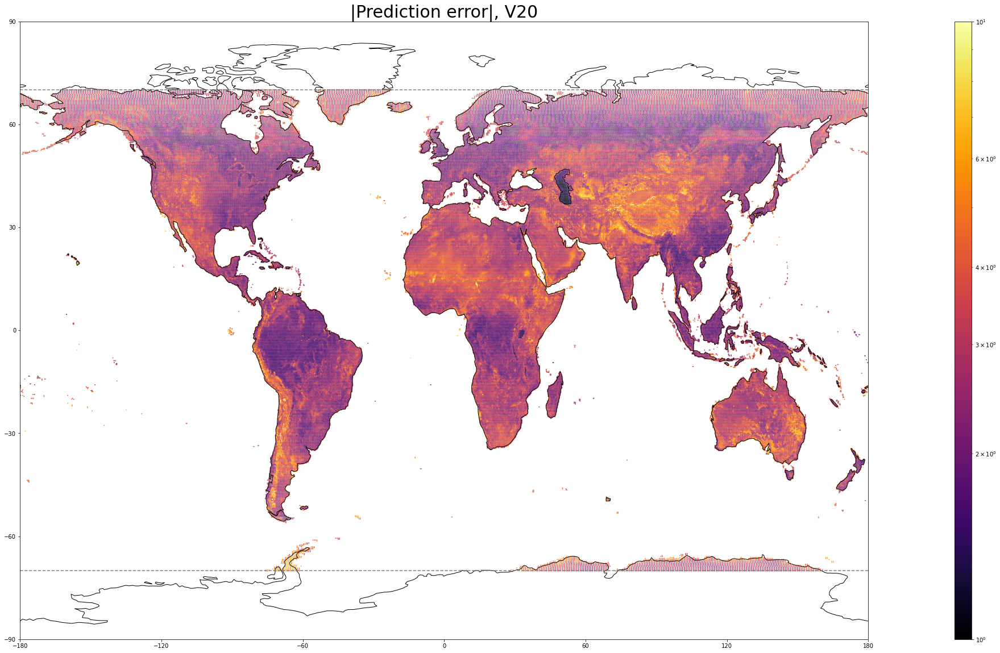

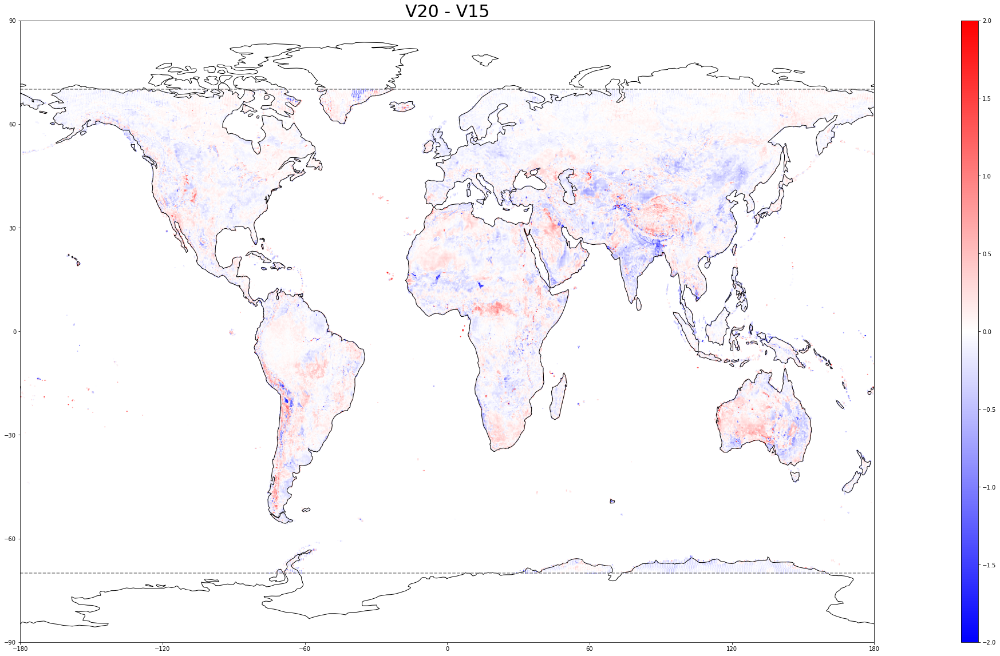

In [10]:
#Plot the map of the prediction error  
cmap = plt.cm.inferno
logscale = True #None
vmin = 1
vmax = 10
plot_map(V15_predictions_averaged,'predicion_error',vmin=vmin,vmax=vmax,cmap=cmap,logscale=logscale,title='|Prediction error|, V15',limits=None,markersize=1)
plot_map(V20_predictions_averaged,'predicion_error',vmin=vmin,vmax=vmax,cmap=cmap,logscale=logscale,title='|Prediction error|, V20',limits=None,markersize=1)

    
#Create a new df that will just hold the differences, and plot it    
data = {'latitude_ERA':   V20_predictions_averaged.latitude_ERA, 
        'longitude_ERA':  V20_predictions_averaged.longitude_ERA,
        'MODIS_LST':      V20_predictions_averaged.MODIS_LST,
        'V15_prediction': V15_predictions_averaged.predictions,
        'V20_prediction': V20_predictions_averaged.predictions,
        'V15_error':      V15_predictions_averaged.predicion_error,
        'V20_error':      V20_predictions_averaged.predicion_error,
        'delta':          V20_predictions_averaged.predicion_error - V15_predictions_averaged.predicion_error}
V20_V15 = pd.DataFrame(data)    
plot_map(V20_V15,'delta',vmin=-2,vmax=+2,cmap=plt.cm.bwr,logscale=False,title='V20 - V15',limits=None,markersize=1)

### 1A. Apply "change in lake cover" mask
Apply a mask to look only at those points where `cl` changed appreciably

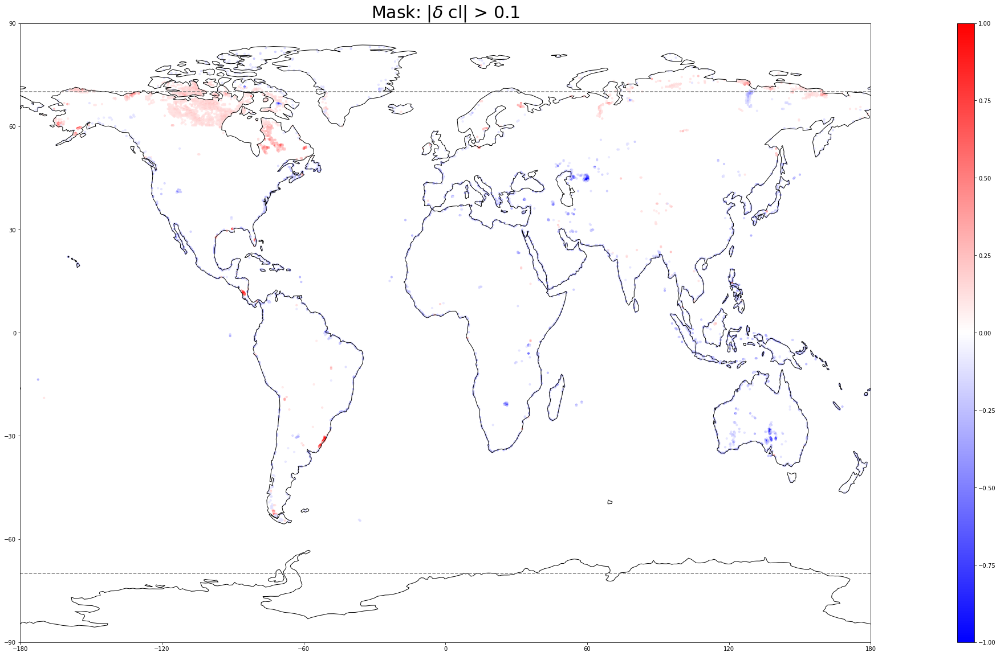

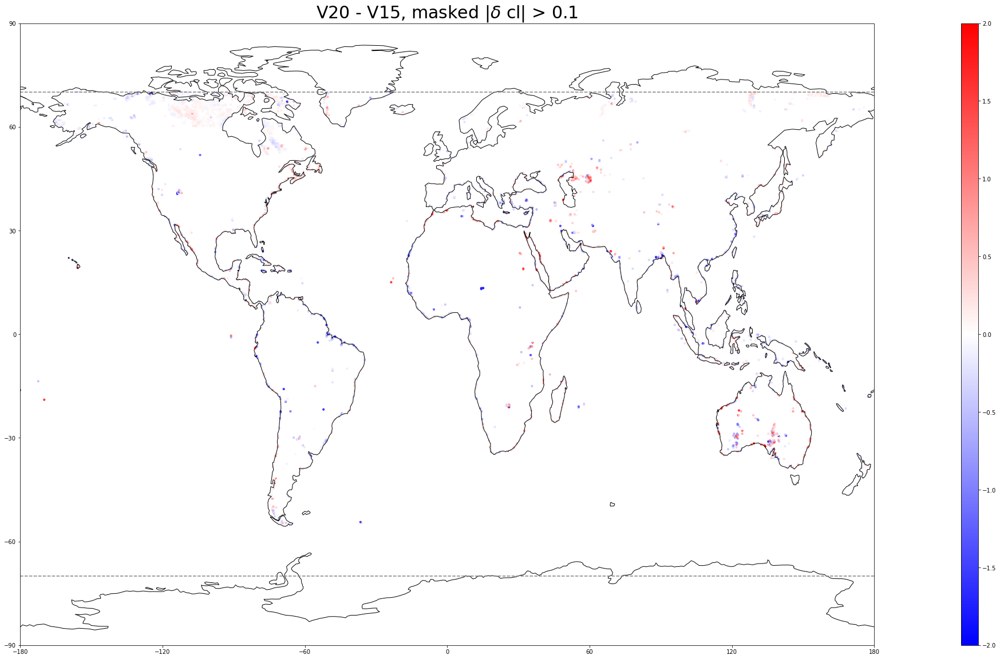

Number of samples: 4314


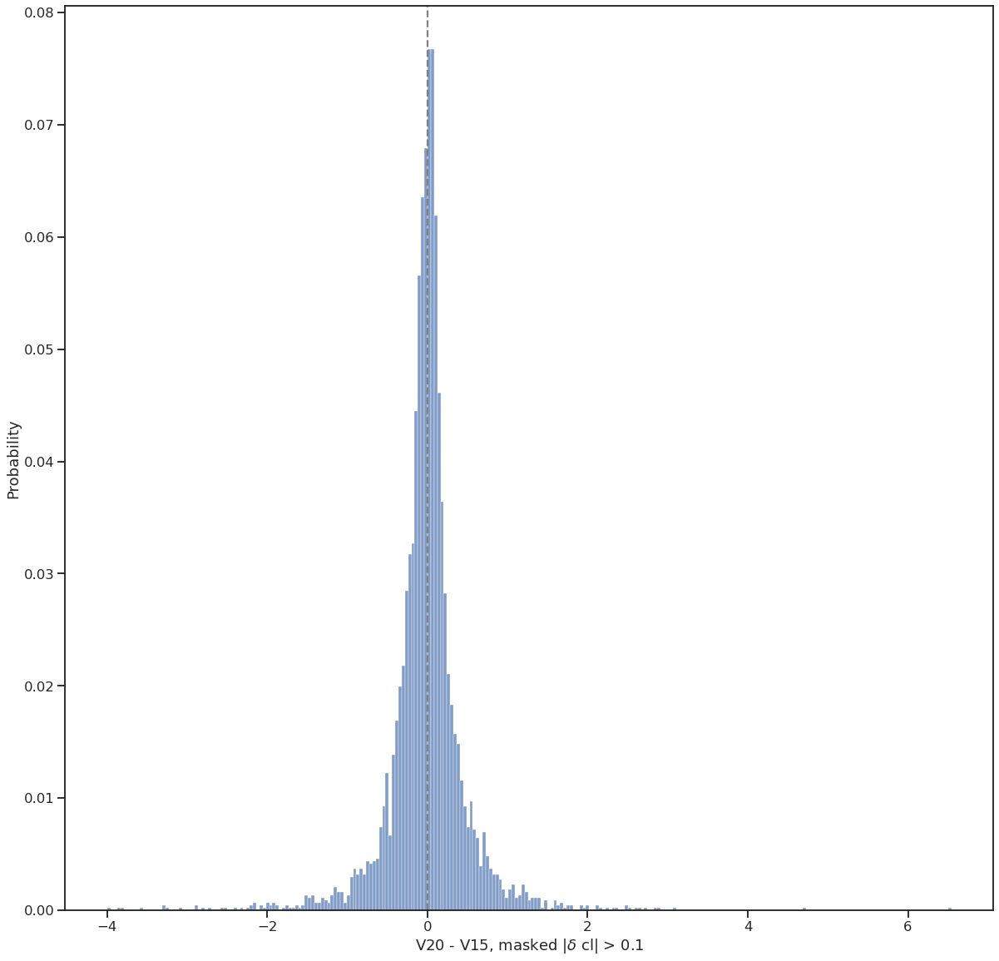

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
10000,2626,-0.029889,60.871581,"(1.225079427259184, 0.22060025560689525)",Insignificant
10001,19,-0.240619,0.440427,"(0.5563264566463155, 0.5814295582563498)",Insignificant
10010,1616,0.042995,37.459434,"(-1.3648167834889124, 0.17240570553316506)",Insignificant
10011,20,-0.274193,0.463607,"(1.1099369839085385, 0.2740008155293249)",Insignificant
10100,8,-0.383471,0.185443,"(0.9250836109510734, 0.37059410313437413)",Insignificant
10110,23,-0.320667,0.533148,"(1.6240623750156722, 0.11150591107235526)",Insignificant
11110,2,-2.872056,0.046361,"(1.4986916538627133, 0.27269198648793735)",Insignificant


-----------------------------------------------------------


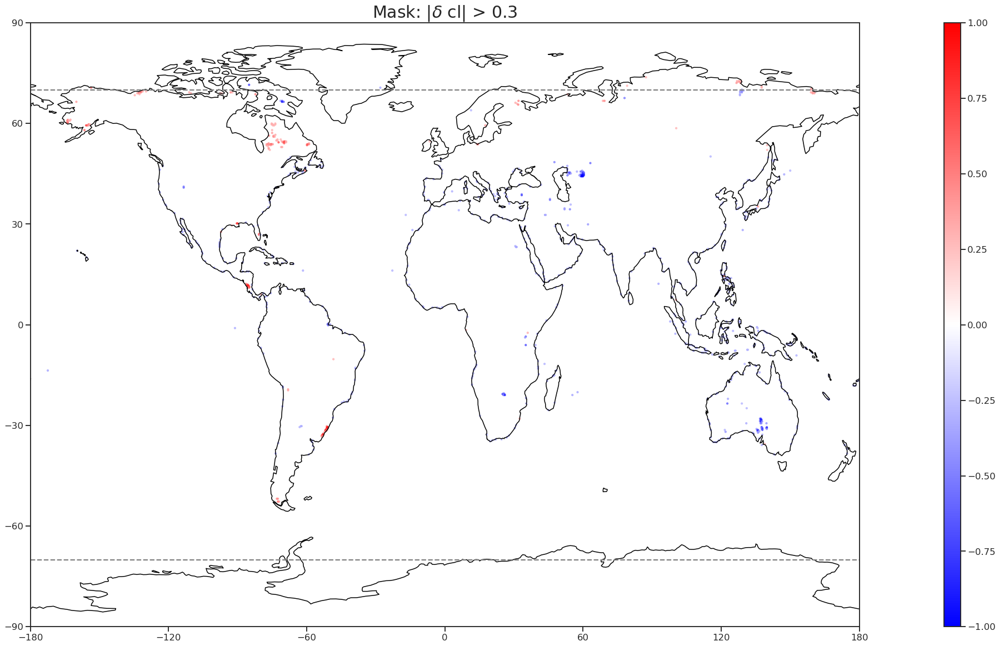

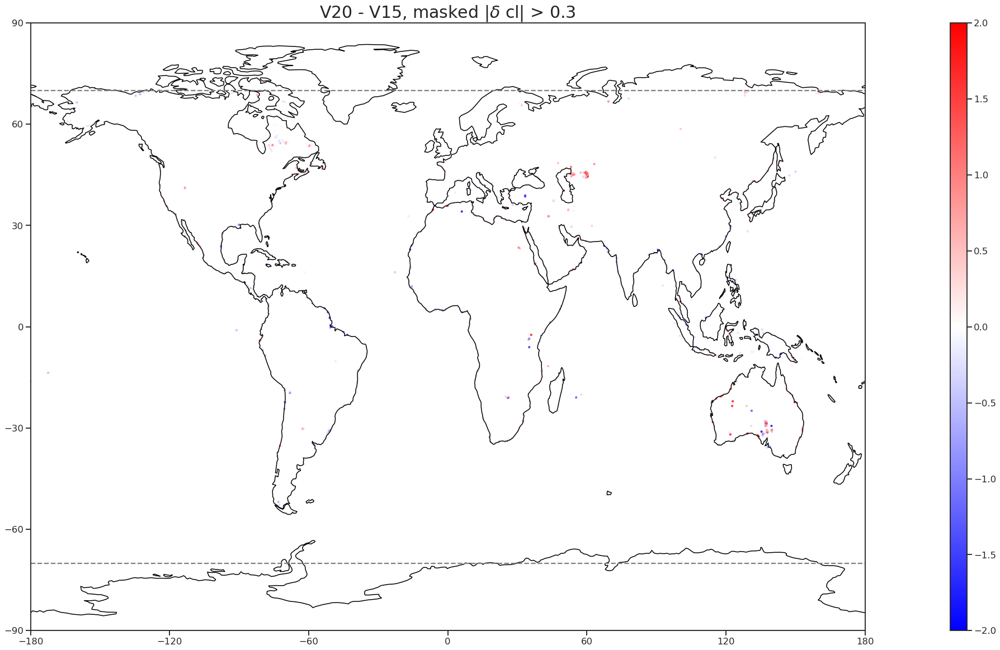

Number of samples: 908


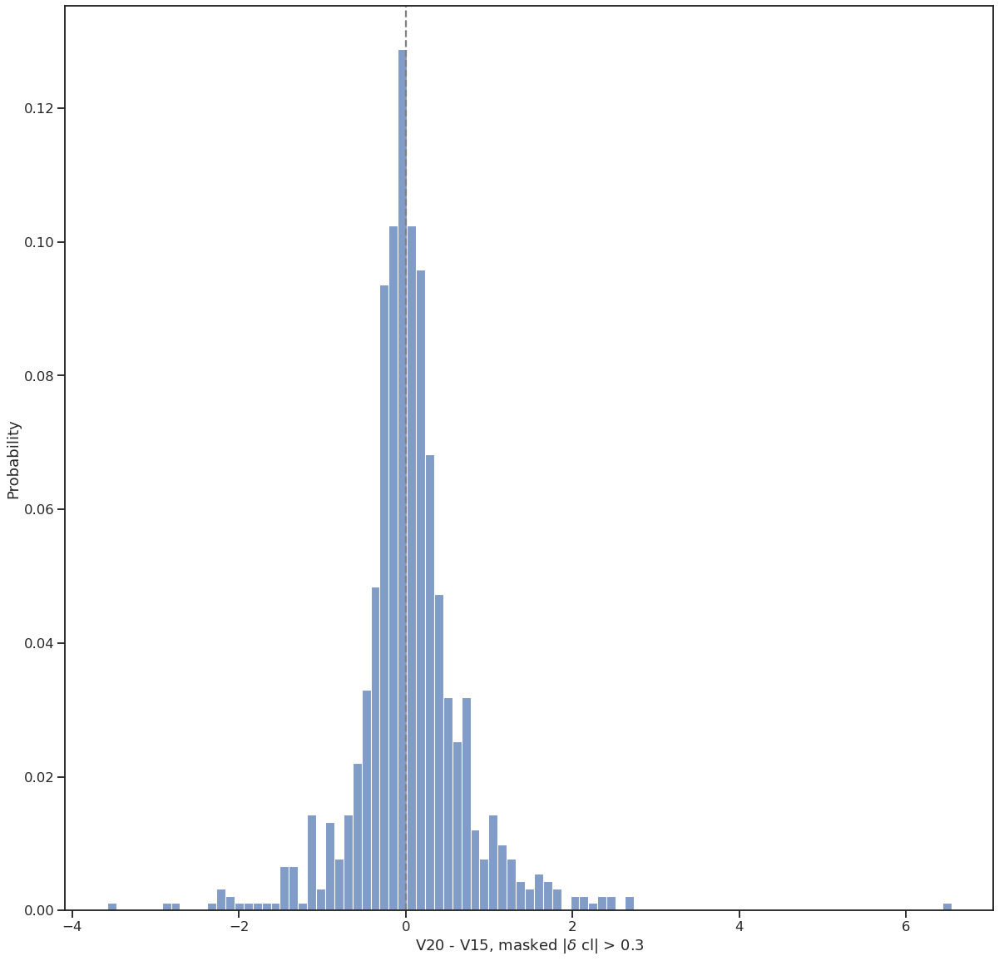

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
10000,753,-0.005398,82.929515,"(0.10451126122893056, 0.9167775669886432)",Insignificant
10010,144,0.331451,15.859031,"(-2.0713354708583616, 0.03922403462580025)",Insignificant
10100,4,-0.125457,0.440529,"(0.43508937789394453, 0.6787117111579899)",Insignificant
10110,7,-0.148625,0.770925,"(0.35294408586395315, 0.7302524380598782)",Insignificant


-----------------------------------------------------------


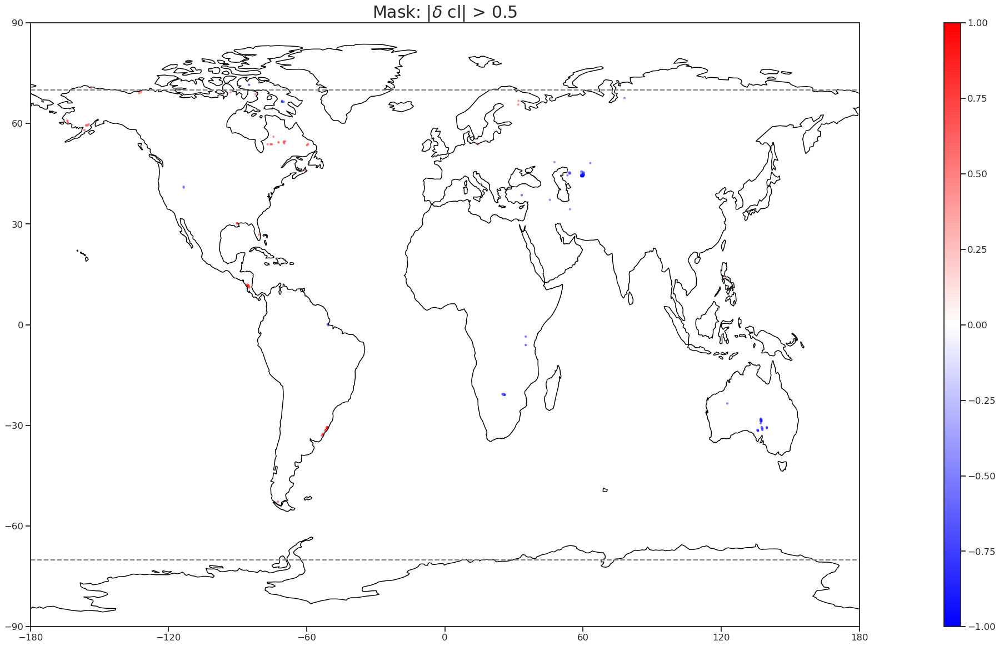

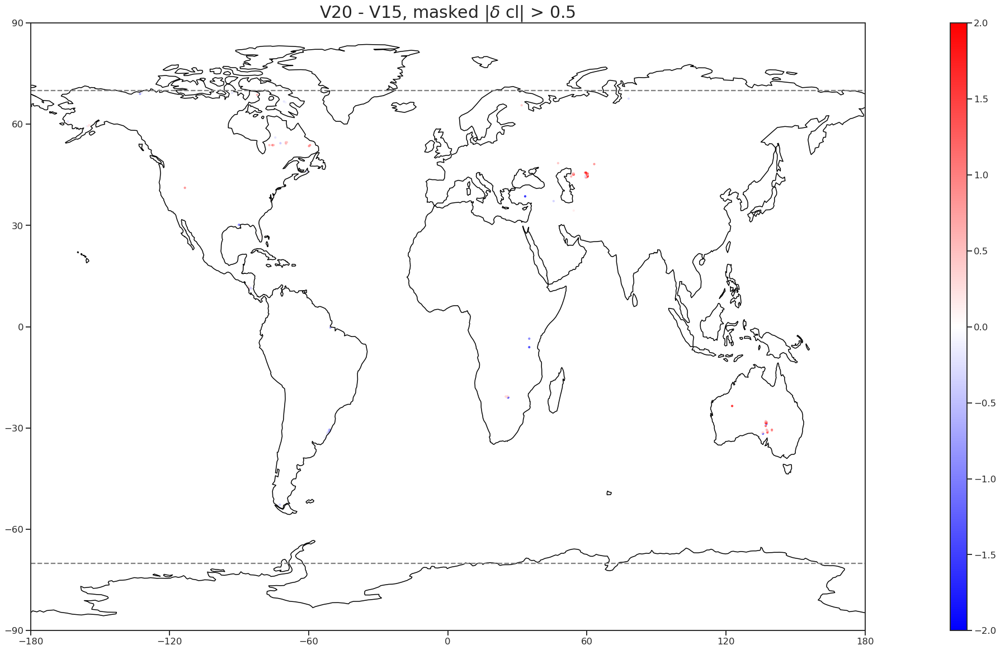

Number of samples: 115


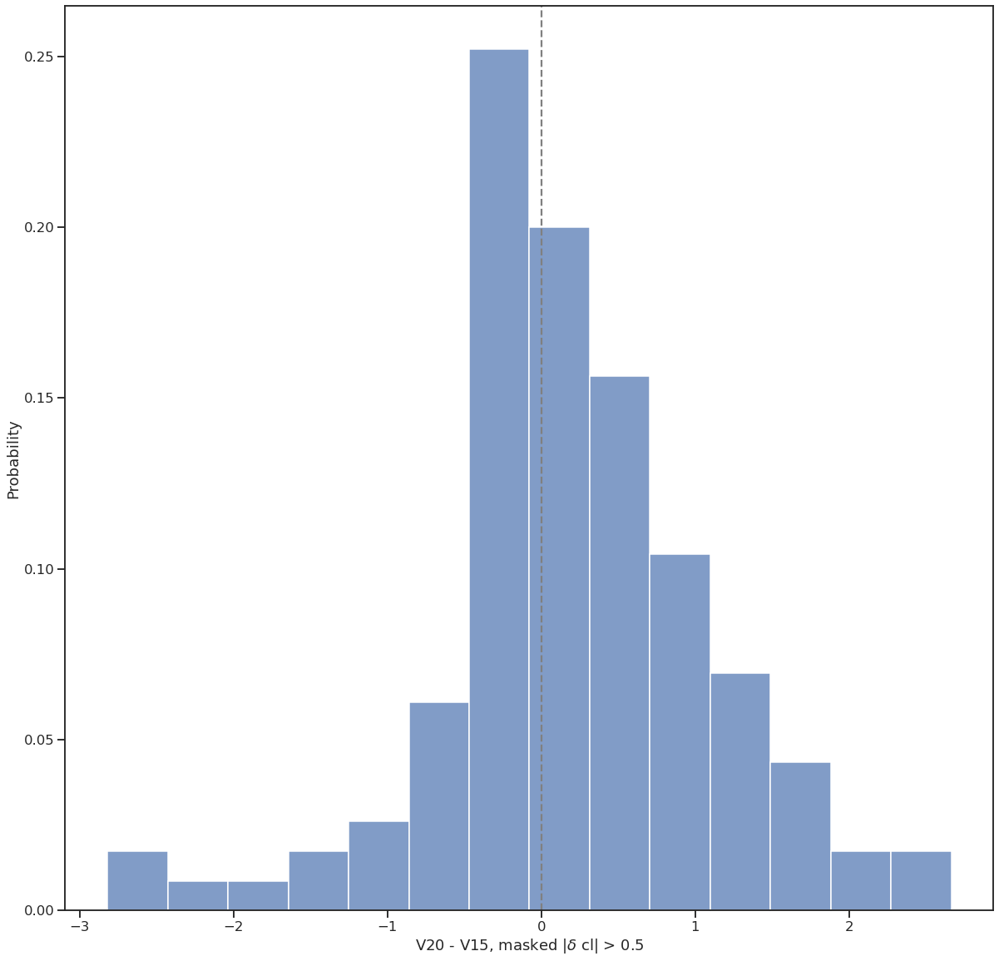

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
10000,52,-0.043796,45.217391,"(0.1334365711110239, 0.894111034699948)",Insignificant
10010,57,0.494407,49.565217,"(-2.111132212050024, 0.036985436265462426)",Insignificant
10100,4,-0.125457,3.478261,"(0.43508937789394453, 0.6787117111579899)",Insignificant
10110,2,-0.334116,1.739130,"(0.2949027010836422, 0.7958633907920943)",Insignificant


-----------------------------------------------------------


In [11]:
for p in [0.1,0.3,0.5]: #Only get points with change in lake cover > p
    #Create a mask
    mask = change_in_fields.query(f'abs(change_in_cl) > {p}')

    #Plot the mask
    plot_map(mask,'change_in_cl',vmin=-1,vmax=1,cmap=plt.cm.bwr,logscale=False,title=f'Mask: |${{\delta}}$ cl| > {p}',limits=None,markersize=10) #What does this mask look like?


    #Apply the mask to the global error_delta_field from earlier
    V20_V15_masked = pd.merge(V20_V15,mask,how='inner',left_on=['latitude_ERA', 'longitude_ERA'], right_on=['latitude', 'longitude']) #inner join.

    # Plot it, along with a distribution of the errors
    plot_map(V20_V15_masked,
             'delta',
             vmin=-2,vmax=+2,
             cmap= plt.cm.bwr,
             logscale=False,
             title=f'V20 - V15, masked |${{\delta}}$ cl| > {p}',
             limits=None,
             markersize=10)


    plot_distribution(V20_V15_masked,'delta',f'V20 - V15, masked |${{\delta}}$ cl| > {p}')
    
    
    
    
    
    #Classification table. For each group/bitstring surface some numbers
    classification_table                                = V20_V15_masked.groupby('bitstring').agg(**{'Number of Pixels':pd.NamedAgg('delta','size'),'AverageDelta':pd.NamedAgg('delta','mean')})     # For each group, count number of pixels and get the average delta      
    classification_table["Percentage"]                  = 100.0* classification_table['Number of Pixels'] / sum(classification_table["Number of Pixels"])                                            # Express number of pixels as a percentage
    classification_table['Stats (t-statistic,p-value)'] = V20_V15_masked.groupby('bitstring').apply(lambda x: significance_test(x['V15_error'], x['V20_error']))                                     # For each group, do a ttest between the V15_errors and the V20_errors
    classification_table['Significant Change?']         = classification_table['Stats (t-statistic,p-value)'].apply(lambda x: significance_boolean(x))
    display(classification_table)
    print ('-----------------------------------------------------------')
    
    
    
    
    
    
    
    


### 1A. Apply bitstring mask

Alternatively, we can look at how the prediction errors change **for each of the grouping bitstring categories**


In [12]:
drop_no_change     = display_table.drop(labels='00000', axis=0)    # Get rid of the category where there are no changes - we dont care about this
list_of_bitstrings = drop_no_change.nlargest(5,columns='Number of Pixels').index.values # Get the n biggest bitstrings

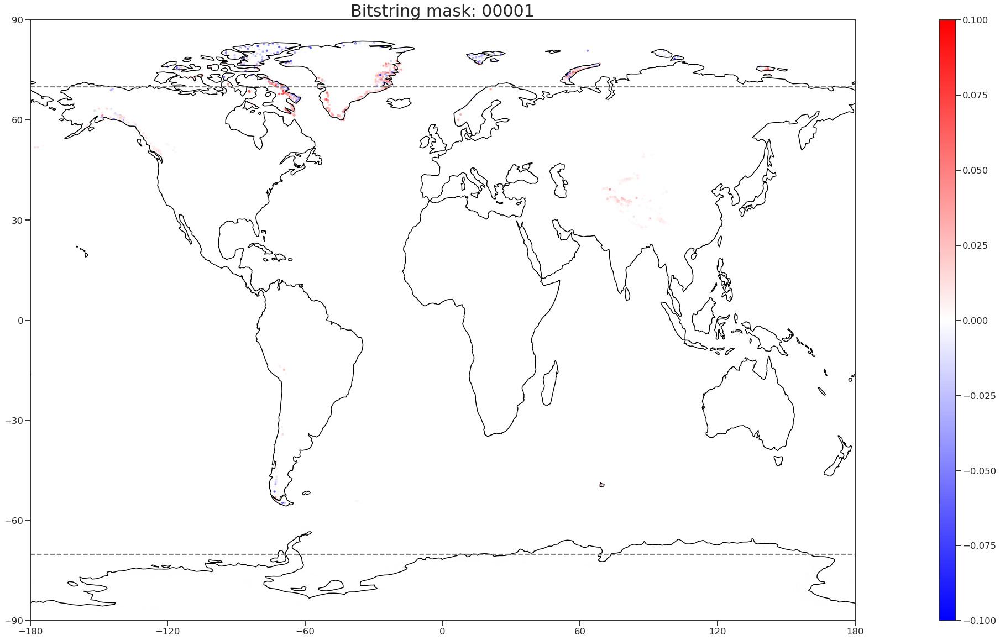

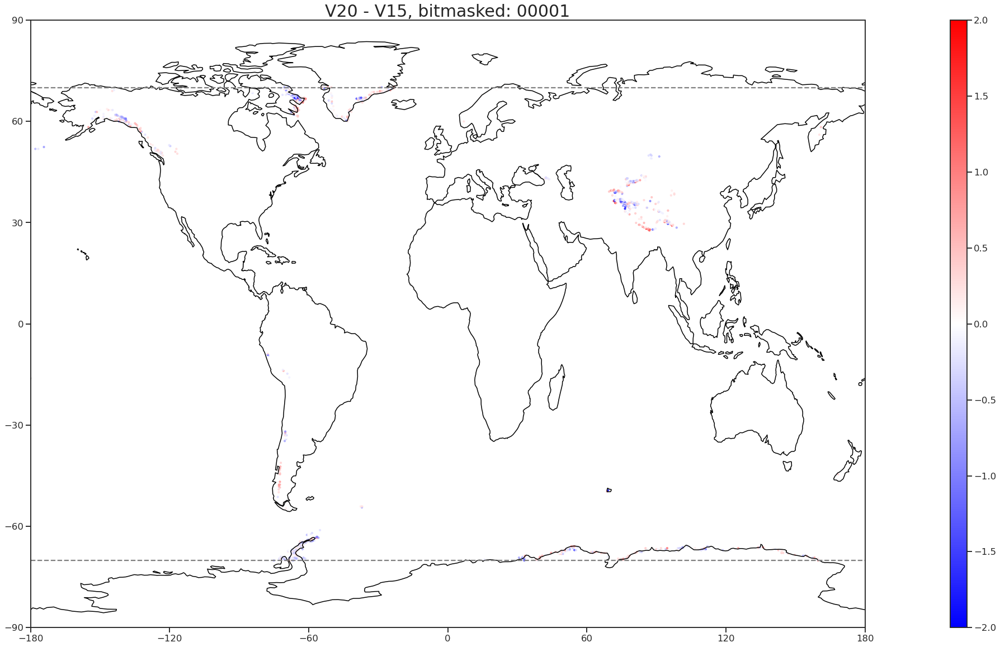

Number of samples: 877


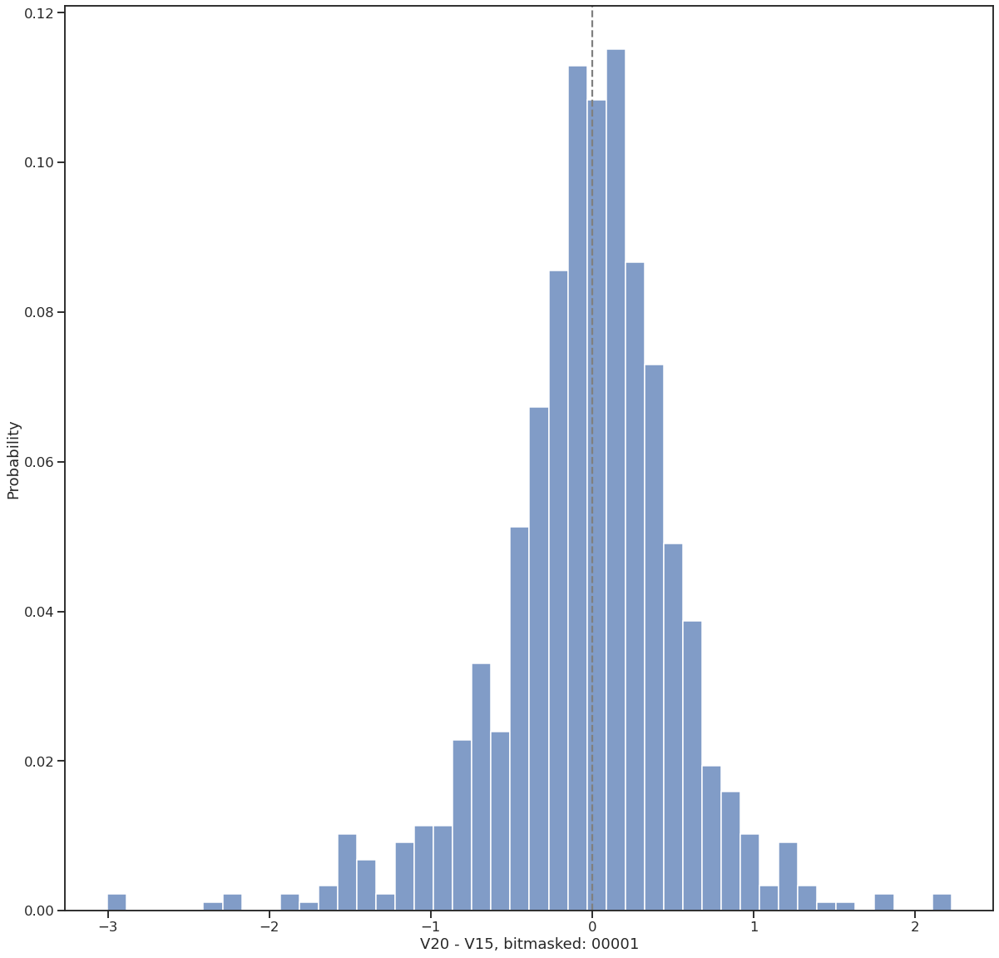

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
00001,877,-0.025897,100.0,"(0.4791534397871495, 0.6318892728697363)",Insignificant


----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------


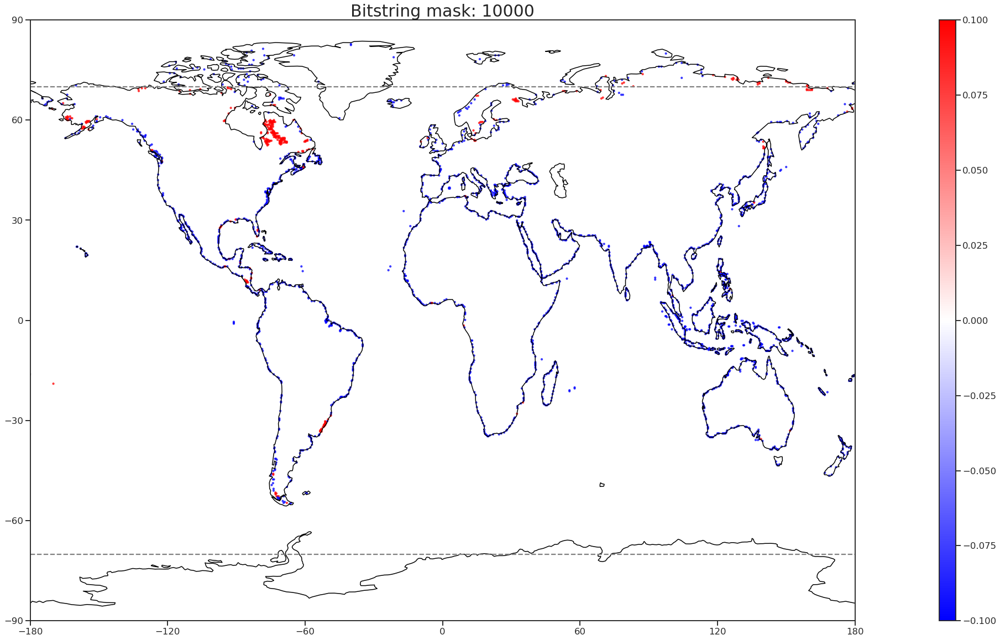

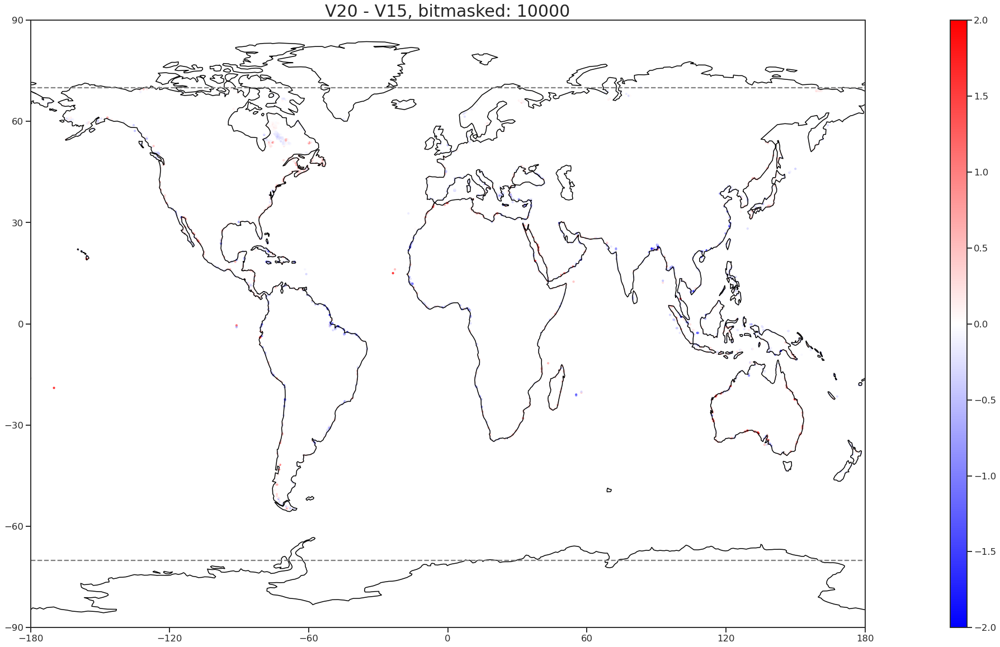

Number of samples: 2626


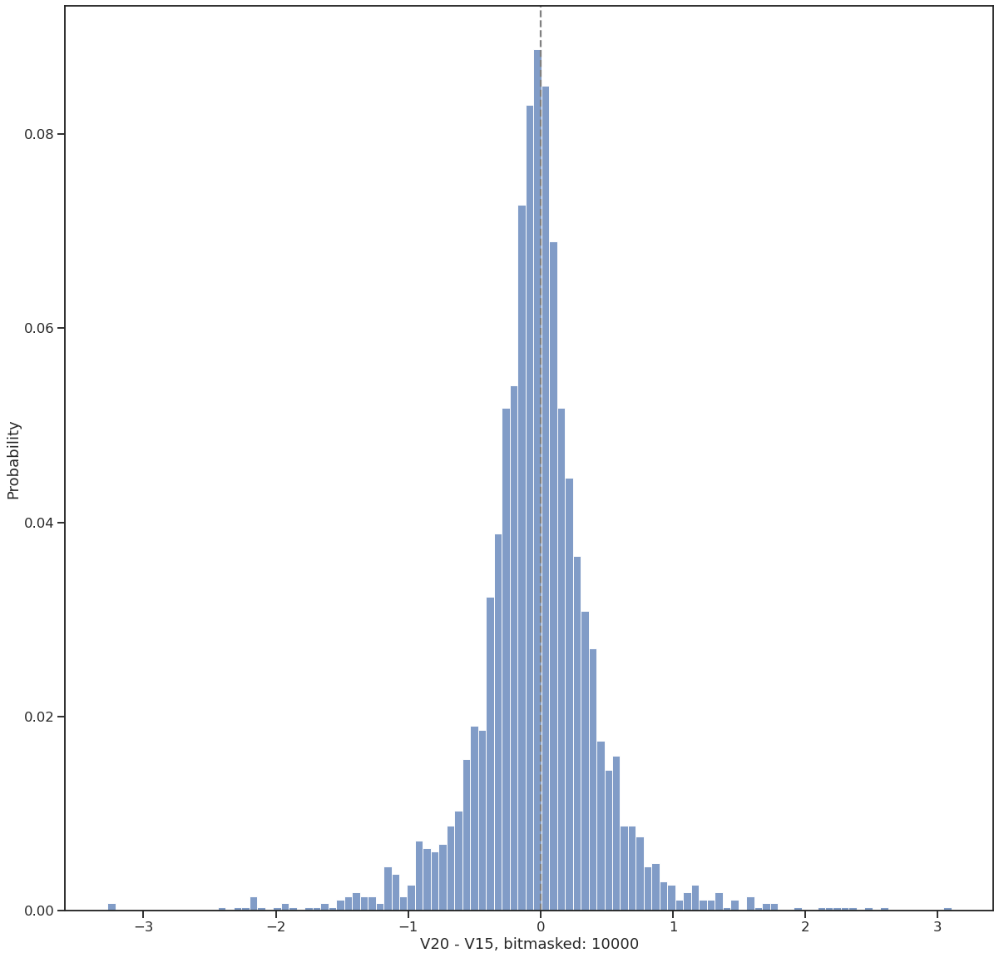

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
10000,2626,-0.029889,100.0,"(1.225079427259184, 0.22060025560689525)",Insignificant


----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------


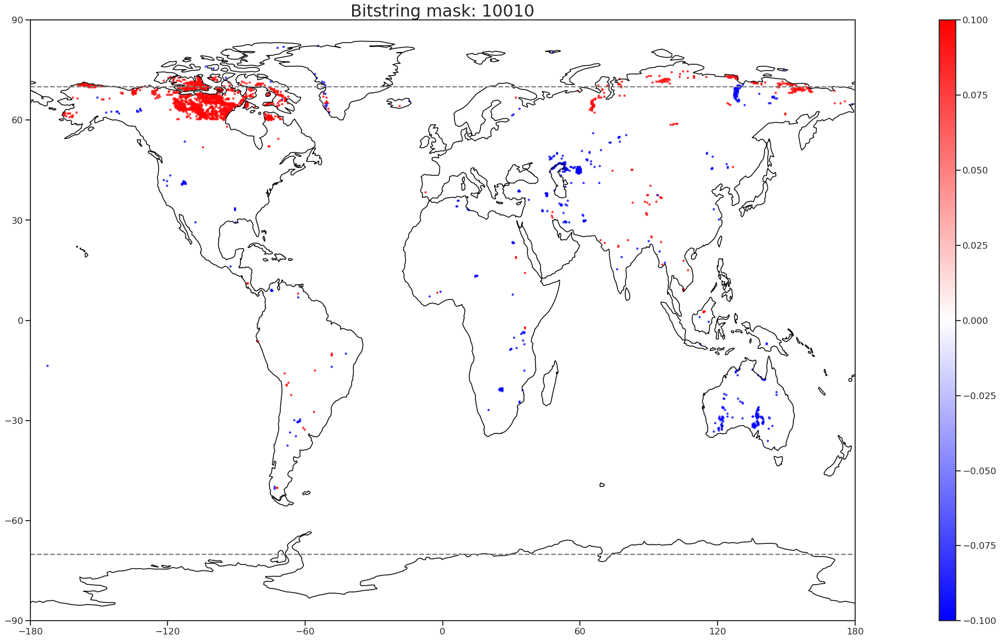

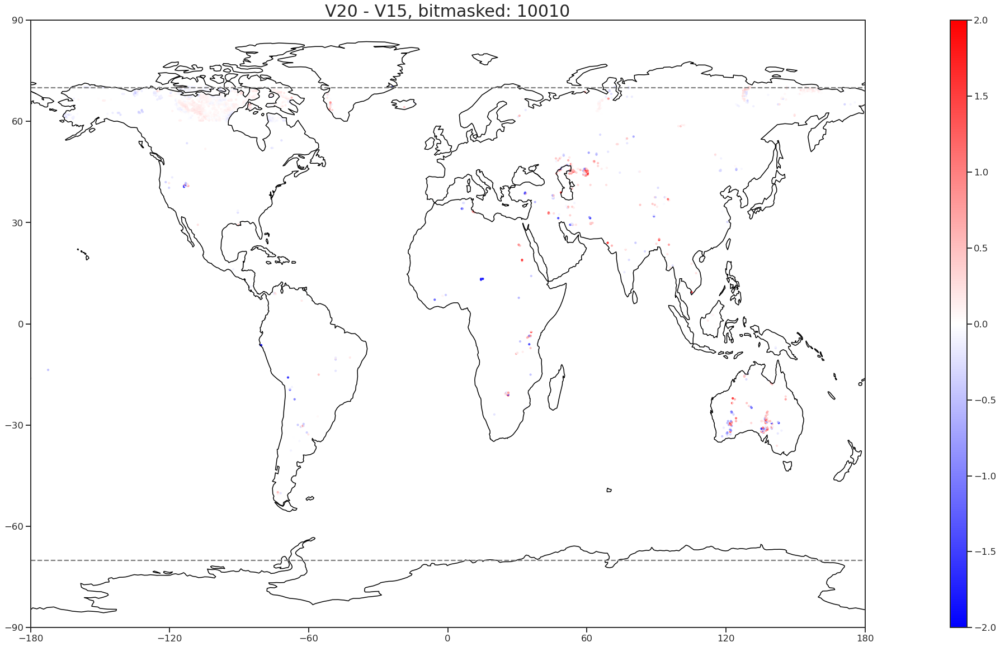

Number of samples: 1616


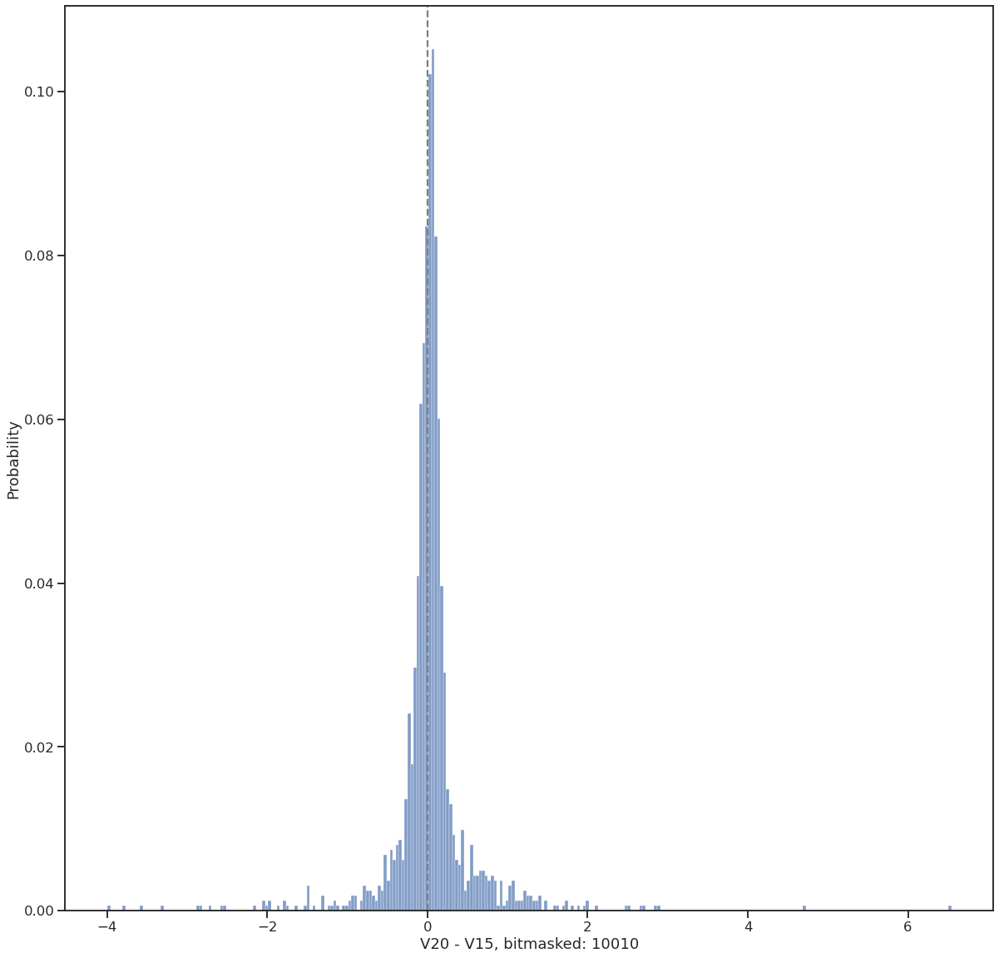

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
10010,1616,0.042995,100.0,"(-1.3648167834889124, 0.17240570553316506)",Insignificant


----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------


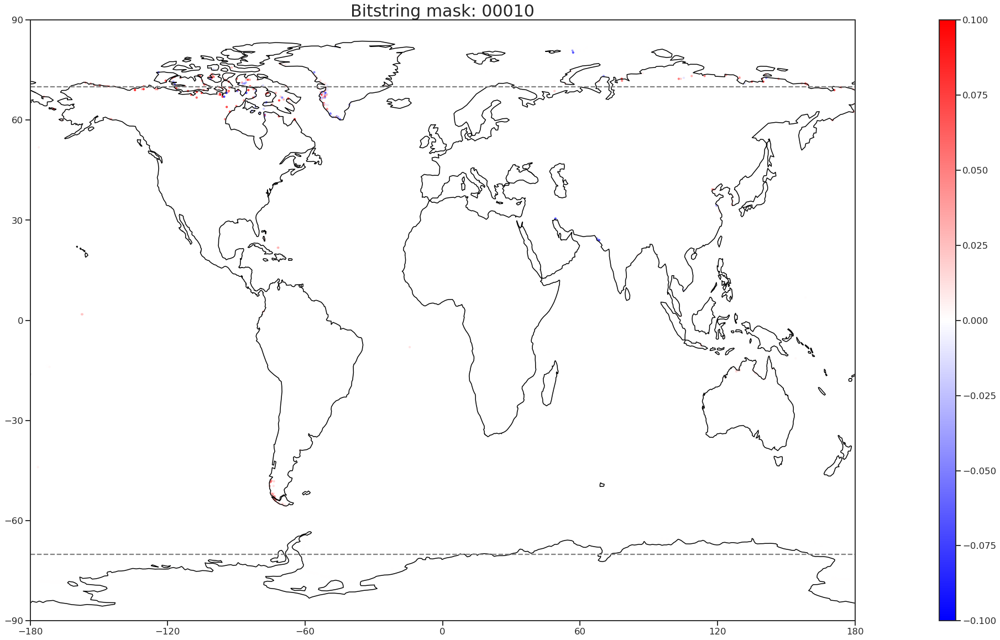

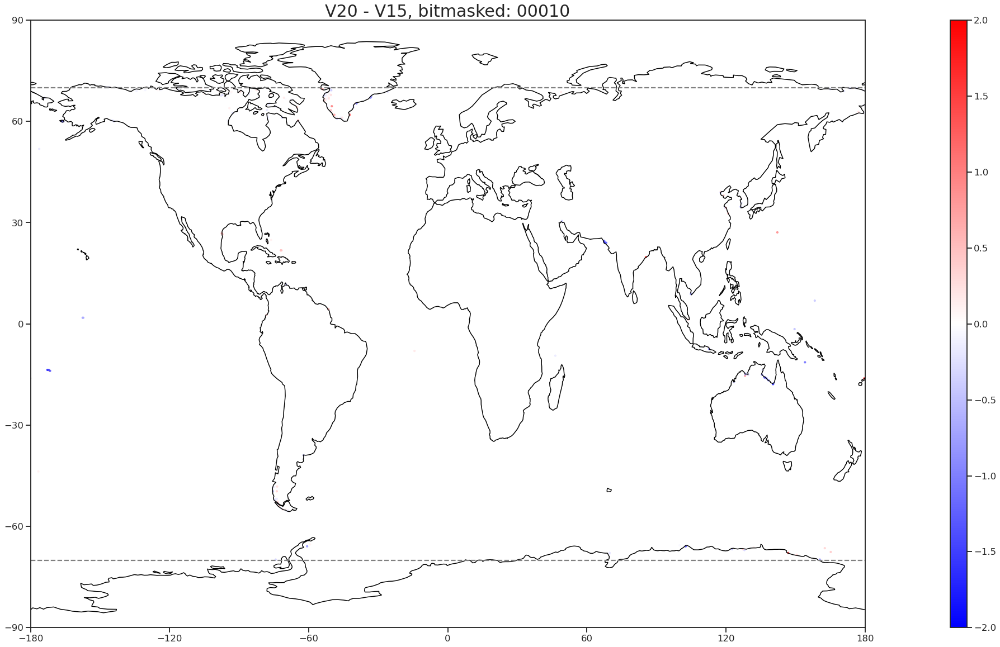

Number of samples: 269


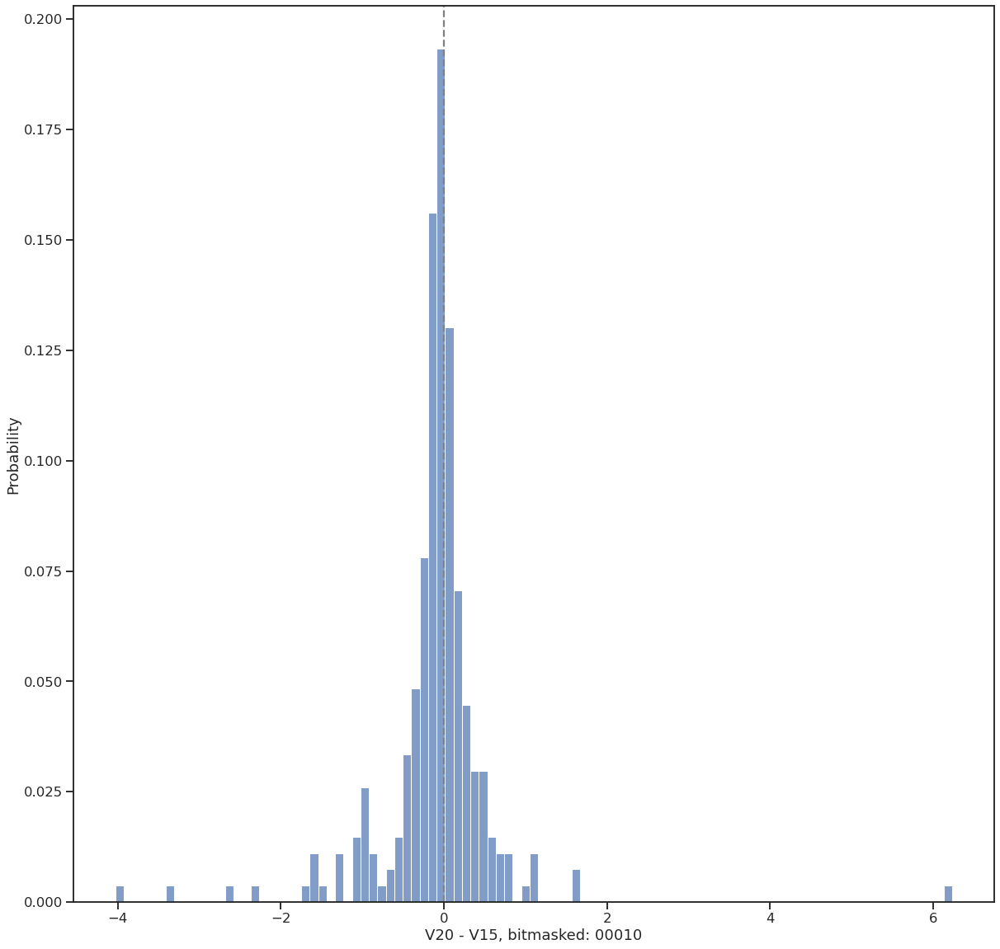

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
00010,269,-0.101927,100.0,"(1.0815777880770212, 0.27992654290030233)",Insignificant


----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------


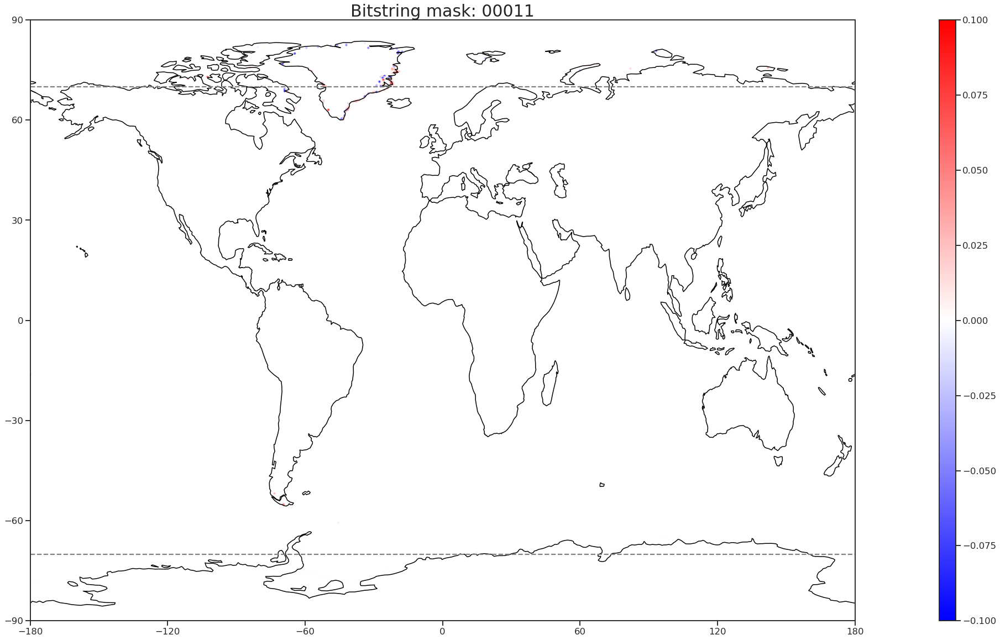

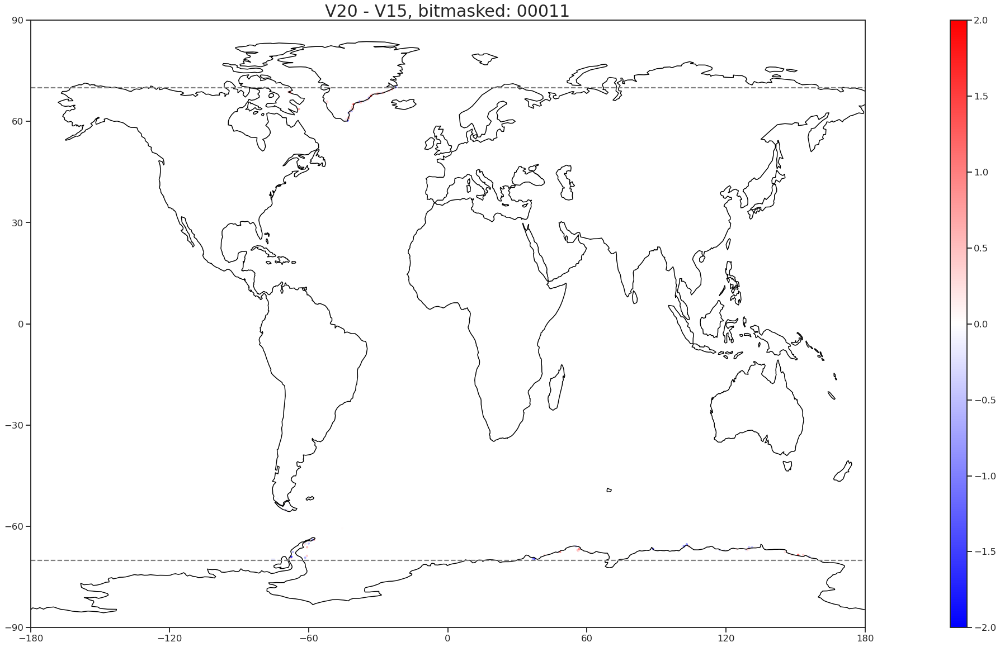

Number of samples: 119


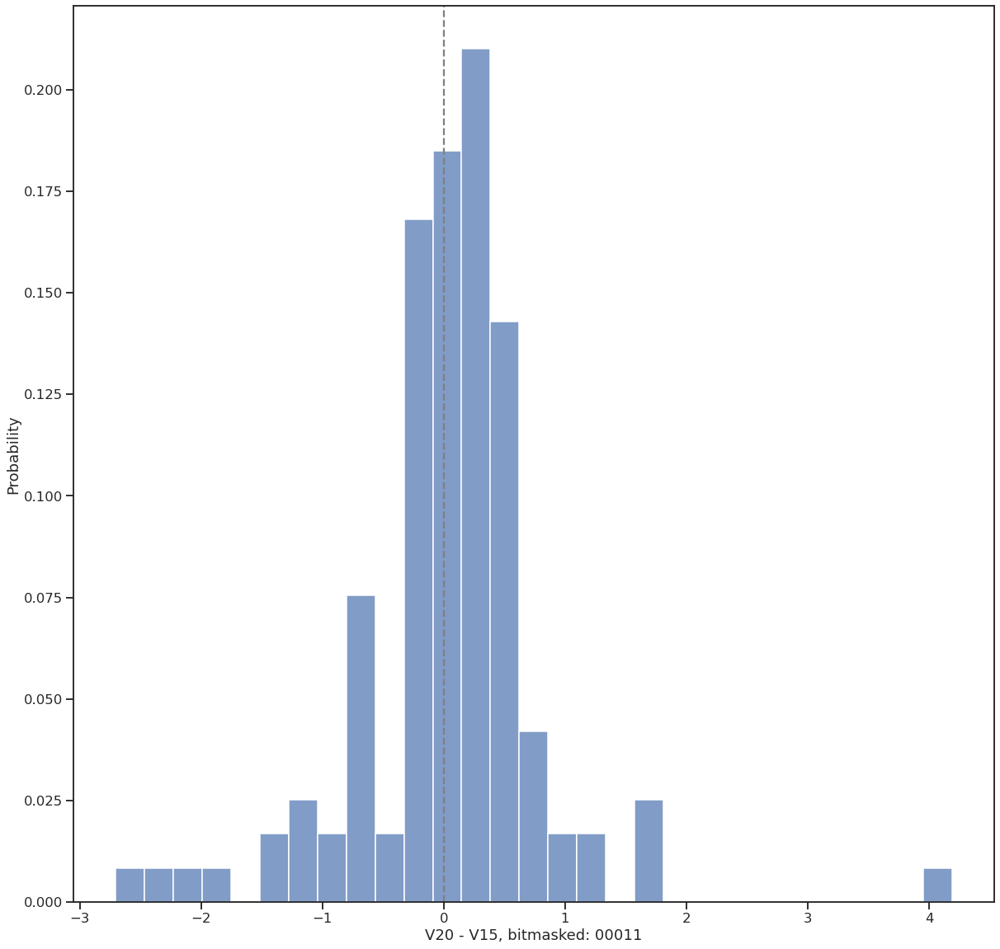

,Number of Pixels,AverageDelta,Percentage,"Stats (t-statistic,p-value)",Significant Change?
bitstring,,,,,
00011,119,0.044715,100.0,"(-0.3802812782409667, 0.7040786656608712)",Insignificant


----------------------------------------------------------------------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------------------------------------------------------------------


In [13]:
for p in list_of_bitstrings: 
    #Create a mask
    mask = change_in_fields.query(f'bitstring == "{p}"')
    
    #Plot the mask
    plot_map(mask,'change_in_cl',vmin=-0.1,vmax=0.1,cmap=plt.cm.bwr,logscale=False,title=f'Bitstring mask: {p}',limits=None,markersize=10) #What does this mask look like?


    #Apply the mask to the global error_delta_field from earlier
    V20_V15_masked = pd.merge(V20_V15,mask,how='inner',left_on=['latitude_ERA', 'longitude_ERA'], right_on=['latitude', 'longitude']) #inner join.
    
    if len(V20_V15_masked) == 0:
        print ('No values with this group')
        continue

    # Plot it, along with a distribution of the errors
    plot_map(V20_V15_masked,
             'delta',
             vmin=-2,vmax=+2,
             cmap= plt.cm.bwr,
             logscale=False,
             title=f'V20 - V15, bitmasked: {p}',
             limits=None,
             markersize=10)


    plot_distribution(V20_V15_masked,'delta',f'V20 - V15, bitmasked: {p}')
    
    
    
    
    
    #Classification table. For each group/bitstring surface some numbers
    classification_table                                = V20_V15_masked.groupby('bitstring').agg(**{'Number of Pixels':pd.NamedAgg('delta','size'),'AverageDelta':pd.NamedAgg('delta','mean')})     # For each group, count number of pixels and get the average delta      
    classification_table["Percentage"]                  = 100.0* classification_table['Number of Pixels'] / sum(classification_table["Number of Pixels"])                                            # Express number of pixels as a percentage
    classification_table['Stats (t-statistic,p-value)'] = V20_V15_masked.groupby('bitstring').apply(lambda x: significance_test(x['V15_error'], x['V20_error']))                                     # For each group, do a ttest between the V15_errors and the V20_errors
    classification_table['Significant Change?']         = classification_table['Stats (t-statistic,p-value)'].apply(lambda x: significance_boolean(x))
    display(classification_table)
    print ('----------------------------------------------------------------------------------------------------------------------------------------------------------------')
    print ('----------------------------------------------------------------------------------------------------------------------------------------------------------------')

    
    
    



---